# Style Transfer
> Here we will implement the paper [`Neural Algorithm of Artistic Style`](https://arxiv.org/pdf/1508.06576) by Gatys et. al. I came across this paper and the concept in the Johno Whitaker's lecture on [Style Transfer](https://course.fast.ai/Lessons/lesson20.html). The video is a must watch. We will use the `minai` library. The `minai` library is implemented in the [Part 2](https://course.fast.ai/) of the fastai course. The library is built over pytorch and easy to use.

The neural algorithm of artistic style is a deep learning technique developed to transfer the style of one image (typically an artwork) onto another image (typically a photograph), creating a new image that combines the content of the photograph with the style of the artwork.
Key Concepts:

    1. Convolutional Neural Networks (CNNs): The algorithm uses a pre-trained CNN, such as VGG-19, to extract features from images at multiple layers. Lower layers capture detailed textures and edges, while higher layers capture more abstract content and style information.

    2. Content Representation: The content of an image is represented by the activations of higher layers of the CNN. These layers encode the spatial arrangement of objects in the image.

    3. Style Representation: The style of an image is represented using Gram matrices of the activations from multiple layers of the CNN. The Gram matrix captures the correlations between different filter responses, representing textures and patterns characteristic of the style.

    4. Optimization Process: The style transfer is achieved by iteratively updating a white noise image (or the content image) to minimize two losses:
        - Content Loss: Ensures that the generated image retains the content of the original photograph. This is typically the squared error between the feature representations of the content image and the generated image at a particular layer.
        - Style Loss: Ensures that the generated image captures the style of the artwork. This is calculated as the squared error between the Gram matrices of the style image and the generated image at multiple layers.

Process:

    1. Extract content features from a specific layer of the CNN for the content image.
    2. Extract style features (Gram matrices) from multiple layers of the CNN for the style image.
    3. Initialize a generated image (either white noise or the content image).
    4. Define a loss function combining content loss and style loss.
    5. Use gradient descent to iteratively update the generated image to minimize the loss function.
    6. The final result is an image that combines the content of the photograph with the artistic style of the artwork.

This algorithm has been widely used and extended in various applications, including stylizing videos, real-time style transfer, and more. It represents a significant advancement in the field of neural networks and computer vision.

In [ ]:
import timm
import fastcore.all as fc

import torch
from torch import nn, optim
from torch.utils.data import DataLoader
import torch.nn.functional as F
import torchvision

from minai.datasets import show_image, show_images
from minai.learner import TrainCB, DeviceCB, ProgressCB, MetricsCB, Learner, DataLoaders, Callback, def_device, to_cpu

/home/conda-envs/fastai/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
timm.list_models('*vgg19*', pretrained=True)

['vgg19.tv_in1k', 'vgg19_bn.tv_in1k']

In [ ]:
vgg19 = timm.create_model('vgg19', pretrained=True).to(def_device).features

In [ ]:
vgg19

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In the paper the authors have replaced the `max_pooling` layers with `average_pooling` layers stating that it improves gradient flow and one obtains more appealing results. In the above vgg19 model there are 5 `max_pooling` layers which we can replace with the following function

In [ ]:
def replace_maxpool_with_avgpool(model):
    for i, l in enumerate(model.children()):
        if isinstance(l, nn.MaxPool2d): 
            model[i] = nn.AvgPool2d(kernel_size=2, stride=2)

In [ ]:
replace_maxpool_with_avgpool(vgg19)

In the paper the content image is depicting the `Neckarfront in Tubingen, Germany`. There are multiple style images:
- The Shipwreck of the Minotaur by JMW Turner, 1805.
- The Starry Night by Vincent Van Gogh, 1889.
- Der Schrei by Edvard Munch, 1893.
- Femme nue assise by Pablo Picaso, 1910.
- Composition VII by Wassily Kandisky, 1913.


In [ ]:
content_url = 'https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg'

In [ ]:
def download_image(url):
    imgb = fc.urlread(url, decode=False)
    return torchvision.io.decode_image(torch.tensor(list(imgb), dtype=torch.uint8)).to(def_device) / 255

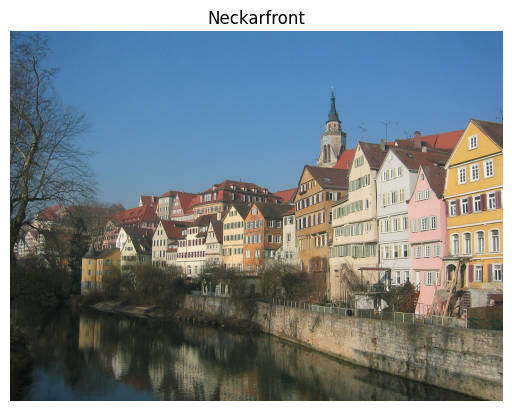

In [ ]:
content_img = download_image(content_url)
show_image(content_img, title='Neckarfront');

## Content Reconstruction
> We can visualize the information at different processing stages in VGG19 by recontructing the above content image from only knowing the network's responses in a particular layer. For reconstruction we will use white noise image as the starting point.

In [ ]:
class TensorModel(nn.Module):
    def __init__(self, t):
        super().__init__()
        self.t = nn.Parameter(t.clone())

    def forward(self, x=0):
        return self.t

In [ ]:
model = TensorModel(torch.rand_like(content_img))
[p.shape for p in model.parameters()]

[torch.Size([3, 768, 1024])]

In the paper, the authors picked the layers `conv1_1`, `conv2_1`, `conv3_1`, `conv4_1` and `conv5_1` for the content reconstruction. Here's a breakdown of what each of these terms means:
- conv1_1: The first convolutional layer in the first block.
- conv2_1: The first convolutional layer in the second block.
- conv3_1: The first convolutional layer in the third block.
- conv4_1: The first convolutional layer in the fourth block.
- conv5_1: The first convolutional layer in the fifth block.


VGG19 is structured in a series of convolutional blocks, each containing multiple convolutional layers followed by a max-pooling layer. The naming convention "convX_Y" denotes the Y-th convolutional layer in the X-th block. Here’s the detailed architecture:

    Block 1:
        conv1_1: 3x3 convolution, 64 filters
        conv1_2: 3x3 convolution, 64 filters
        Max-pooling

    Block 2:
        conv2_1: 3x3 convolution, 128 filters
        conv2_2: 3x3 convolution, 128 filters
        Max-pooling

    Block 3:
        conv3_1: 3x3 convolution, 256 filters
        conv3_2: 3x3 convolution, 256 filters
        conv3_3: 3x3 convolution, 256 filters
        conv3_4: 3x3 convolution, 256 filters
        Max-pooling

    Block 4:
        conv4_1: 3x3 convolution, 512 filters
        conv4_2: 3x3 convolution, 512 filters
        conv4_3: 3x3 convolution, 512 filters
        conv4_4: 3x3 convolution, 512 filters
        Max-pooling

    Block 5:
        conv5_1: 3x3 convolution, 512 filters
        conv5_2: 3x3 convolution, 512 filters
        conv5_3: 3x3 convolution, 512 filters
        conv5_4: 3x3 convolution, 512 filters
        Max-pooling

So the layers that we will pick are `0, 5, 10, 19, 28`

The VGG19 has been trained on imagenet dataset and their [mean and standard deviation](https://stackoverflow.com/questions/58151507/why-pytorch-officially-use-mean-0-485-0-456-0-406-and-std-0-229-0-224-0-2) are `[0.485, 0.456, 0.406]` and `[0.229, 0.224, 0.225]` respectively. We will normalize the above content image with the same mean and standard deviation

In [ ]:
mean = torch.tensor([0.485, 0.456, 0.406], device=def_device)[:, None, None] # 3, 1, 1
std = torch.tensor([0.229, 0.224, 0.225], device=def_device)[:, None, None] # 3, 1, 1

In [ ]:
mean.shape, std.shape, content_img.shape

(torch.Size([3, 1, 1]), torch.Size([3, 1, 1]), torch.Size([3, 768, 1024]))

In [ ]:
content_img.min(), content_img.max(), content_img.mean(), content_img.std()

(tensor(0., device='cuda:0'),
 tensor(1., device='cuda:0'),
 tensor(0.44, device='cuda:0'),
 tensor(0.22, device='cuda:0'))

In [ ]:
def normalize(img, mean, std):
    return (img - mean) / std

content_norm_img = normalize(content_img, mean, std)
content_norm_img.min(), content_norm_img.max(), content_norm_img.mean(dim=(1,2)), content_norm_img.std(dim=(1,2))

(tensor(-2.12, device='cuda:0'),
 tensor(2.64, device='cuda:0'),
 tensor([-0.35, -0.02,  0.29], device='cuda:0'),
 tensor([0.96, 0.88, 1.10], device='cuda:0'))

We can also normalize using torchvision's normalize function

In [ ]:
from torchvision.transforms.functional import normalize

In [ ]:
content_norm_img = normalize(content_img, mean, std)
content_norm_img.min(), content_norm_img.max(), content_norm_img.mean(dim=(1, 2)), content_norm_img.std(dim=(1,2))

(tensor(-2.12, device='cuda:0'),
 tensor(2.64, device='cuda:0'),
 tensor([-0.35, -0.02,  0.29], device='cuda:0'),
 tensor([0.96, 0.88, 1.10], device='cuda:0'))

Following is the function to get the features from the layers

In [ ]:
def calc_features(x, layers=(0, 5, 10, 19, 28)):
    x = normalize(x, mean, std)
    feats = []
    for i, layer in enumerate(vgg19):
        x = layer(x)
        if i in layers:
            feats.append(x)
    return feats

In [ ]:
feats = calc_features(content_img)

In [ ]:
[p.shape for p in feats]

[torch.Size([64, 768, 1024]),
 torch.Size([128, 384, 512]),
 torch.Size([256, 192, 256]),
 torch.Size([512, 96, 128]),
 torch.Size([512, 48, 64])]

A loss function will be needed to detect how much the starting noisy white image is close to the features

In [ ]:
class ContentLoss(nn.Module):
    def __init__(self, img, layers=(0, 5, 10, 19, 28)):
        super().__init__()
        fc.store_attr()
        with torch.no_grad():
            self.feats = calc_features(img, layers=layers)

    def forward(self, x):
        return sum(F.mse_loss(l1, l2) for l1, l2 in zip(calc_features(x, layers=self.layers), self.feats))

Setting up the infrastructure for training with `minai` library

In [ ]:
class DummyDataset:
    def __init__(self, length=1):
        self.length = length
    def __len__(self): return self.length
    def __getitem__(self, idx): return 0, 0

In [ ]:
def get_dummy_dls(length):
    return DataLoaders(DataLoader(DummyDataset(length), 1), DataLoader(DummyDataset(1), 1))

In [ ]:
class ImageOptCB(TrainCB):
    def predict(self, learn): learn.preds = learn.model()
    def get_loss(self, learn): learn.loss = learn.loss_func(learn.preds)

In [ ]:
class ImageLogCB(Callback):
    order = ProgressCB.order + 1
    def __init__(self, log_every=10):
        fc.store_attr()
        self.i = 0
        self.imgs = []
    def after_batch(self, learn):
        if self.i % self.log_every == 0: self.imgs.append(to_cpu(learn.preds.clip(0, 1)))
        self.i += 1
    def after_fit(self, learn):
        show_images(self.imgs)

We can try reconstructing the `content image` with following layers

1. `conv1_1`

In [ ]:
content_loss = ContentLoss(content_img, layers=(0,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(30)]
learn = Learner(model, get_dummy_dls(150), content_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.048,0,True
0.000,0,False


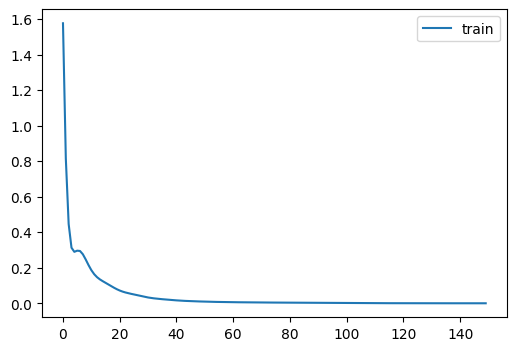

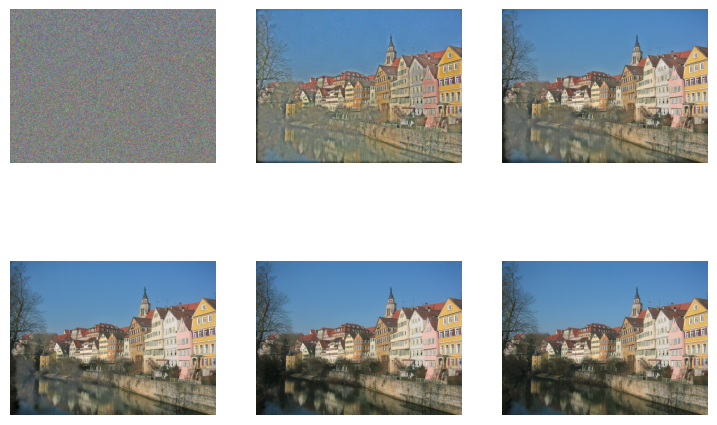

In [ ]:
learn.fit(1)

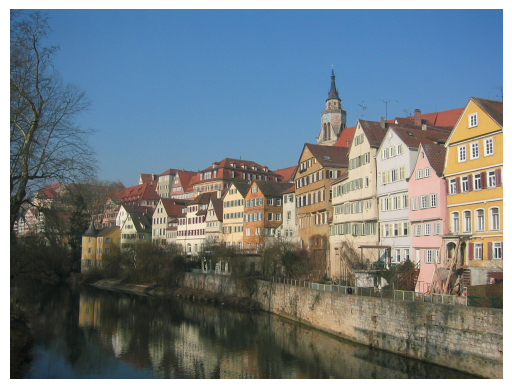

In [ ]:
show_image(to_cpu(model().clip(0, 1)));

2. `conv2_1`

In [ ]:
content_loss = ContentLoss(content_img, layers=(5,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(30)]
learn = Learner(model, get_dummy_dls(150), content_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.189,0,True
0.019,0,False


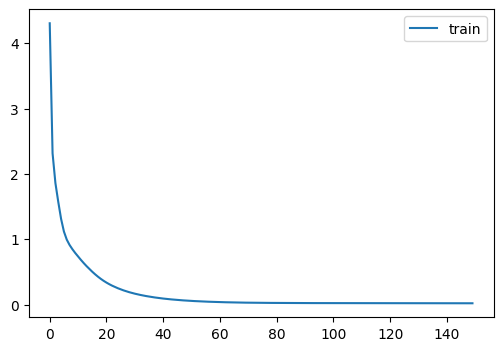

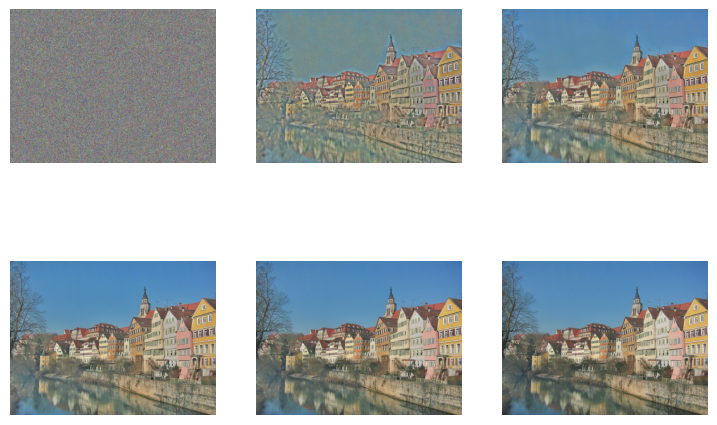

In [ ]:
learn.fit(1)

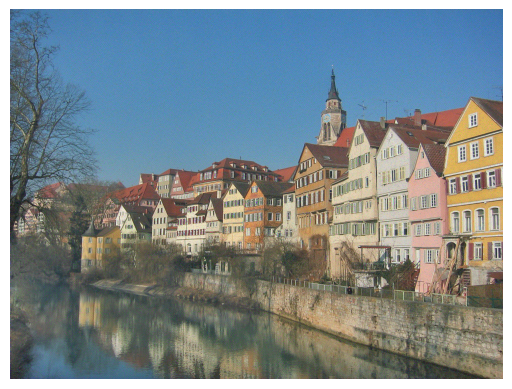

In [ ]:
show_image(to_cpu(model().clip(0, 1)));

3. `conv3_1`

In [ ]:
content_loss = ContentLoss(content_img, layers=(10,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(30)]
learn = Learner(model, get_dummy_dls(150), content_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.244,0,True
0.037,0,False


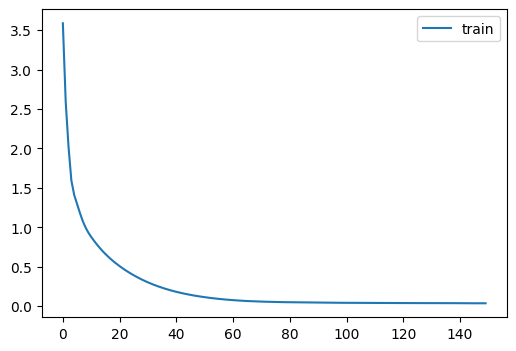

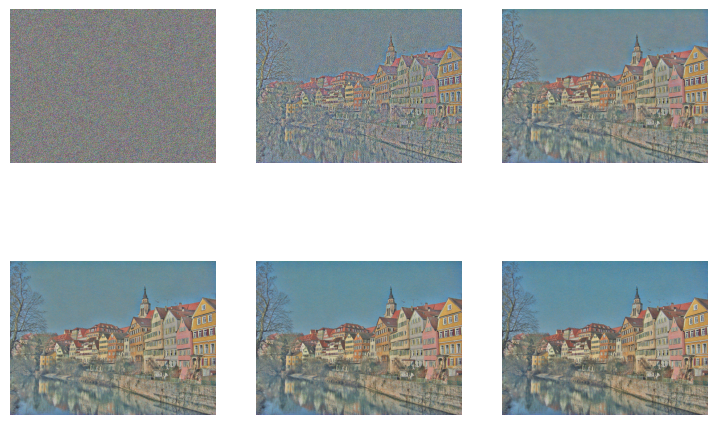

In [ ]:
learn.fit(1)

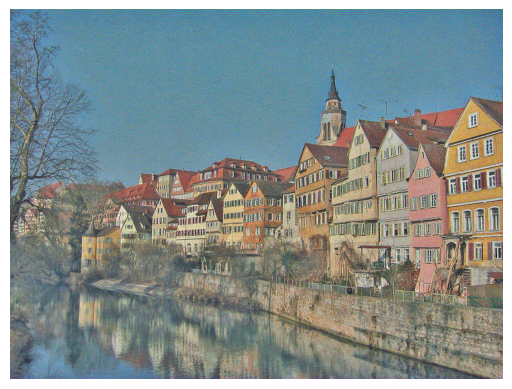

In [ ]:
show_image(to_cpu(model().clip(0, 1)));

4. `conv4_1`

In [ ]:
content_loss = ContentLoss(content_img, layers=(19,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(30)]
learn = Learner(model, get_dummy_dls(150), content_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.102,0,True
0.026,0,False


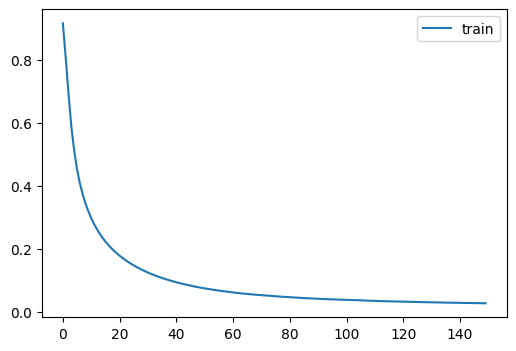

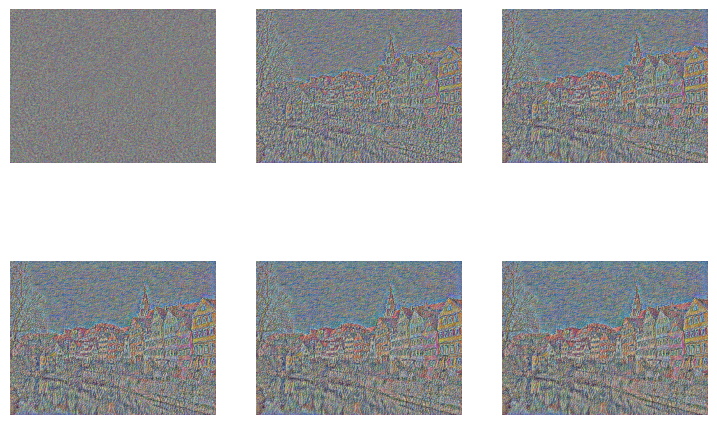

In [ ]:
learn.fit(1)

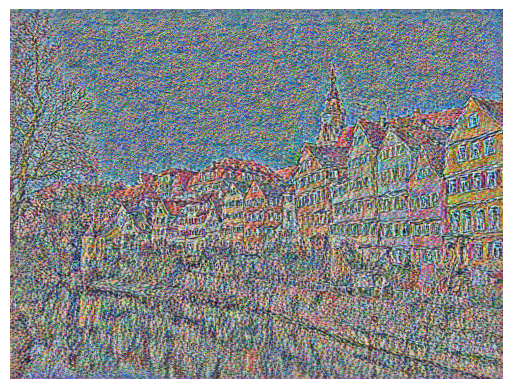

In [ ]:
show_image(to_cpu(learn.model().clip(0, 1)));

5. `conv5_1`

In [ ]:
content_loss = ContentLoss(content_img, layers=(28,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(30)]
learn = Learner(model, get_dummy_dls(150), content_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.013,0,True
0.002,0,False


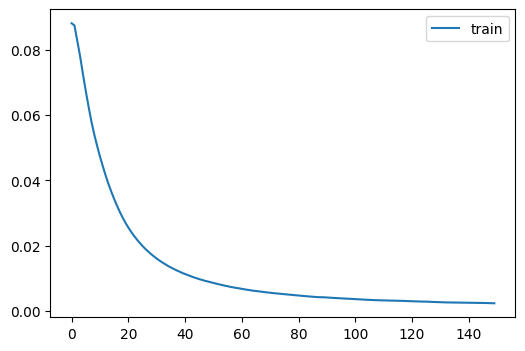

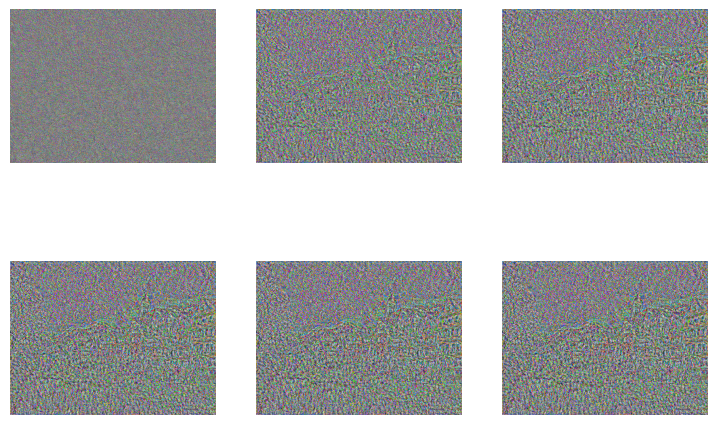

In [ ]:
learn.fit(1)

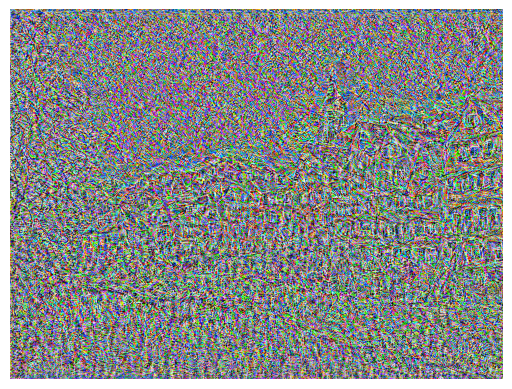

In [ ]:
show_image(to_cpu(learn.model().clip(0, 1)));

The results of the above layers are not that similar to paper's results. We may required more iterations or changes in hyperparameter to get the same kind of results as in the paper.

## Style Reconstruction
> The style representation computes correlation between different features in different layers of the CNN using gram matrix

The idea here is that we will measure the **correlation** between features. Given a feature map with f features in an `h` x `w` grid, we will flatten out the spatial component and then for every feature we will take the dot product of that row with itself, giving an `f` x `f` matrix as the result. Each entry in this matrix qualifies how correlated the relevant pair of features are and how frequently are and how frequently they occur -  exactly what we want. In this diagram each feature is represented as colored dot.

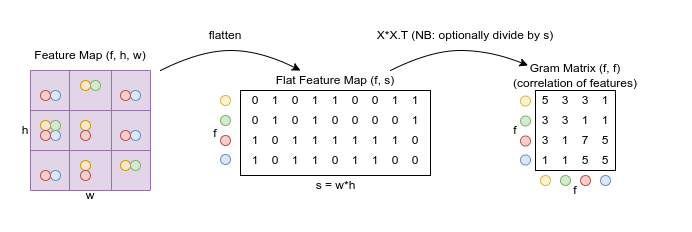

Before creating the infrastructure for calculating the gram matrix and training for style reconstruction, we will download the `The Starry Night` image by Vincent Van Gogh

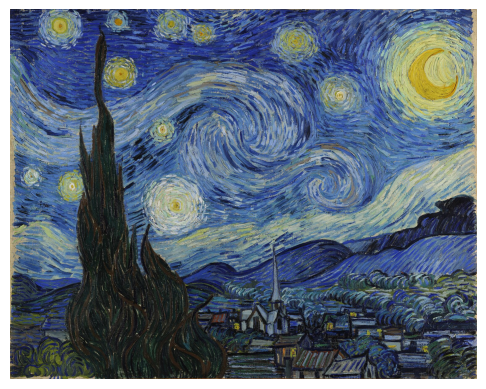

In [ ]:
style_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1513px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg'
style_img = download_image(style_url)
show_image(style_img);

Now lets setup the infrastructure

In [ ]:
def calc_gram_matrix(x, layers=(0, 5, 10, 19, 28)):
    return fc.L(torch.einsum('chw, dhw -> cd', f, f)/ (f.shape[-1] * f.shape[-2]) for f in calc_features(x, layers))

In [ ]:
gram_matrix = calc_gram_matrix(style_img)

In [ ]:
class StyleLoss(nn.Module):
    def __init__(self, img, layers=(0, 5, 10, 19, 28), layers_weight=(1.0, 0.8, 0.5, 0.3, 0.1)):
        super().__init__()
        fc.store_attr()
        with torch.no_grad():
            self.gram_matrix = calc_gram_matrix(img, self.layers)
    def forward(self, x):
        return sum(w * F.mse_loss(g1, g2) for w, g1, g2 in zip(self.layers_weight, calc_gram_matrix(x, layers=self.layers), self.gram_matrix))

We can try reconstructing the `style image` with following layers

1. `conv1_1`

In [ ]:
style_loss = StyleLoss(style_img, layers=(0,), layers_weight=(1.0,))
model = TensorModel(torch.rand_like(style_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), style_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.002,0,True
0.000,0,False


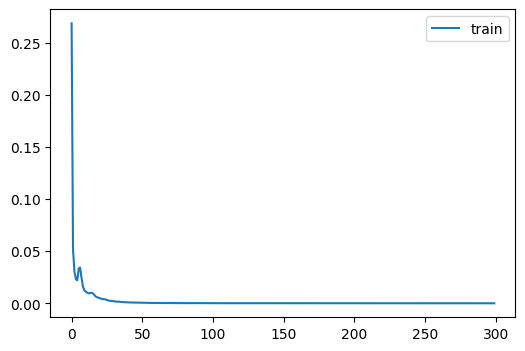

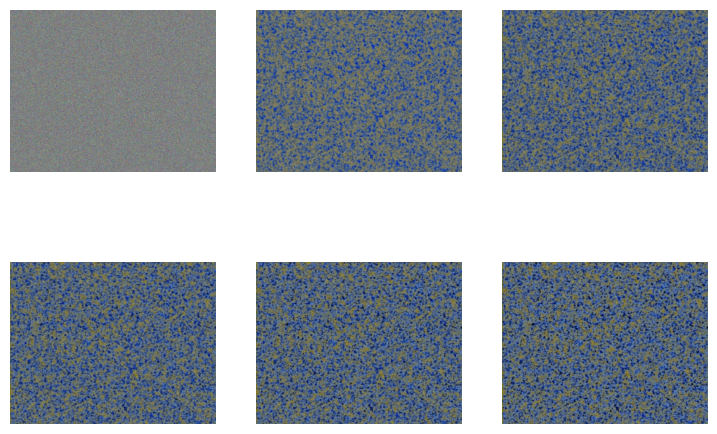

In [ ]:
learn.fit(1)

2. `conv1_1` and `conv2_1`

In [ ]:
style_loss = StyleLoss(style_img, layers=(0,5,), layers_weight=(1.0, 0.8))
model = TensorModel(torch.rand_like(style_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(240)]
learn = Learner(model, get_dummy_dls(1200),  style_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.005,0,True
0.000,0,False


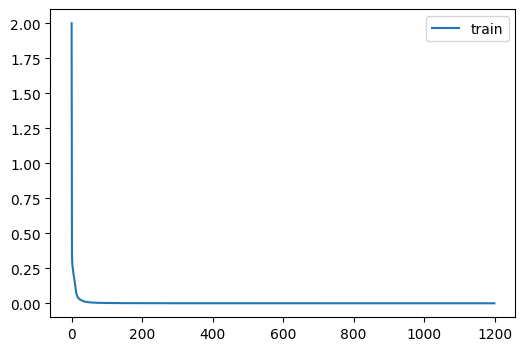

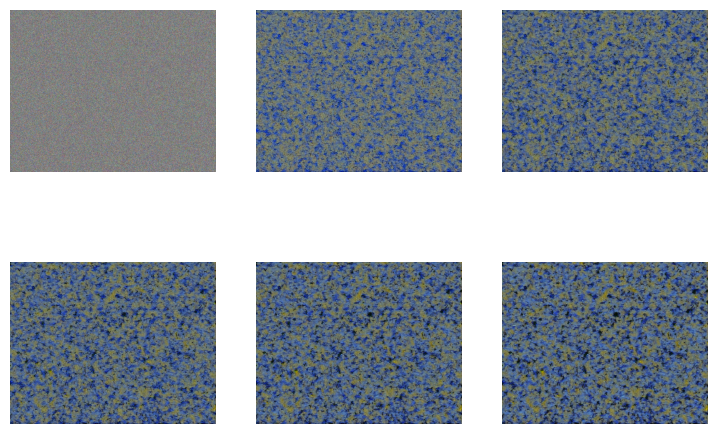

In [ ]:
learn.fit(1)

3. `conv1_1`, `conv2_1` and `conv3_1`

In [ ]:
style_loss = StyleLoss(style_img, layers=(0,5,10,), layers_weight=(1.0, 0.8, 0.5,))
model = TensorModel(torch.rand_like(style_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), style_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.052,0,True
0.001,0,False


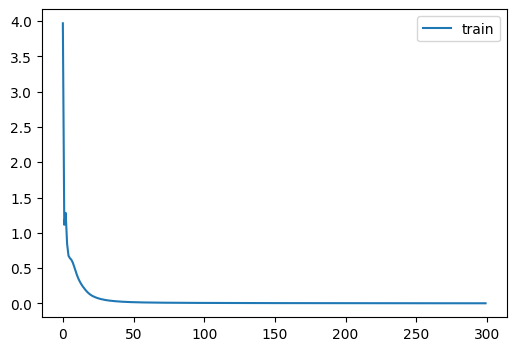

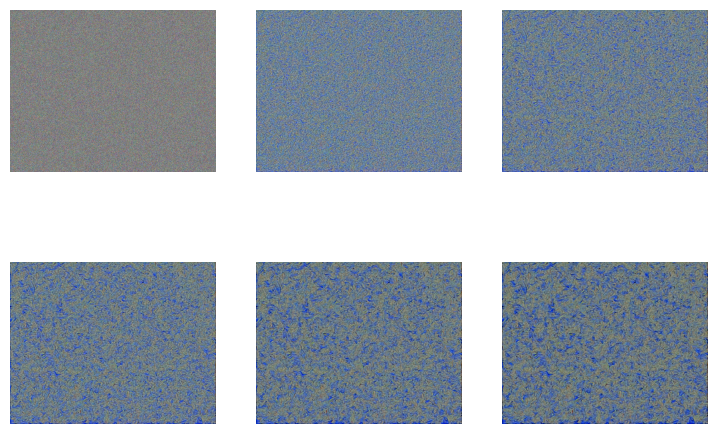

In [ ]:
learn.fit(1)

4. `conv1_1`, `conv2_1`, `conv3_1` and `conv4_1`

In [ ]:
style_loss = StyleLoss(style_img, layers=(0,5,10,19,), layers_weight=(1.0, 0.8, 0.5, 0.3,))
model = TensorModel(torch.rand_like(style_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), style_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.052,0,True
0.001,0,False


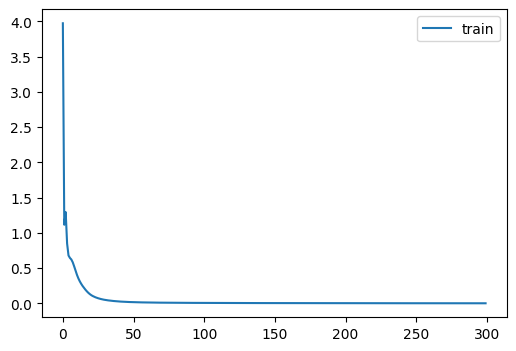

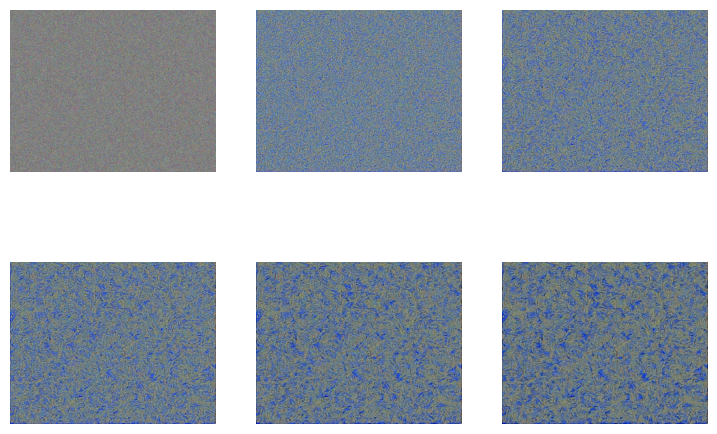

In [ ]:
learn.fit(1)

4. `conv1_1`, `conv2_1`, `conv3_1`, `conv4_1` and `conv5_1`

In [ ]:
style_loss = StyleLoss(style_img, layers=(0,5,10,19,28))
model = TensorModel(torch.rand_like(style_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), style_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.052,0,True
0.001,0,False


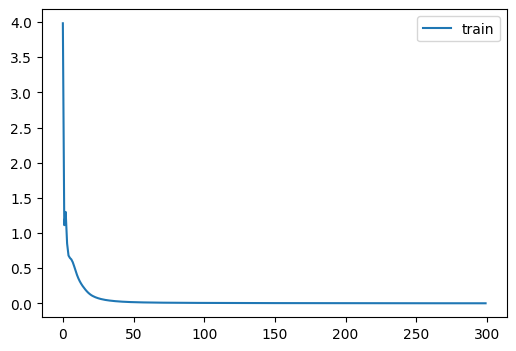

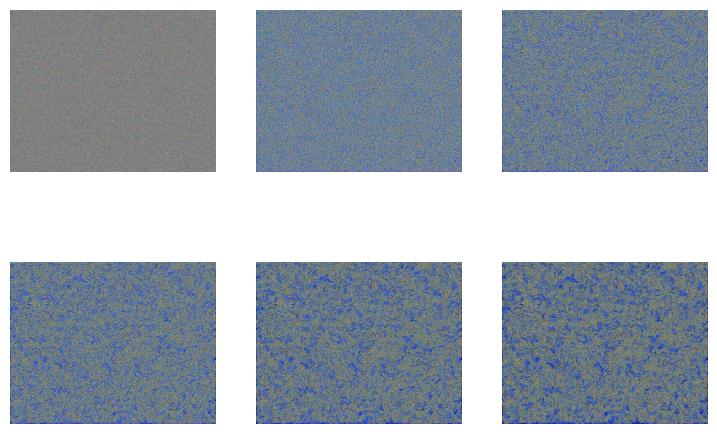

In [ ]:
learn.fit(1)

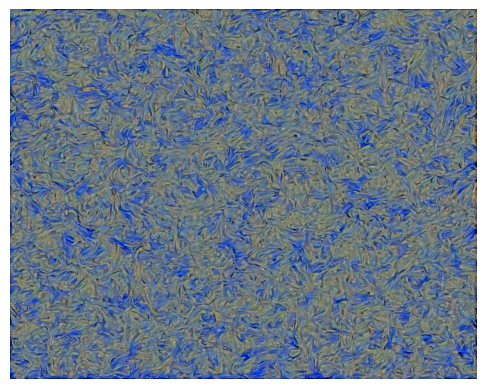

In [ ]:
show_image(learn.model().clip(0,1));

## Content + Style Representation

Here we will mix the content image with different style images and see the results

We will combine the losses: 1. `content_loss` and 2. `style_loss`. In the paper the authors combine both the losses with different ratios $ \alpha / \beta $

In [ ]:
def combine_loss(x, alpha=1, beta=1.5):
    return alpha * content_loss(x) + beta * style_loss(x)

### The Starry Nights

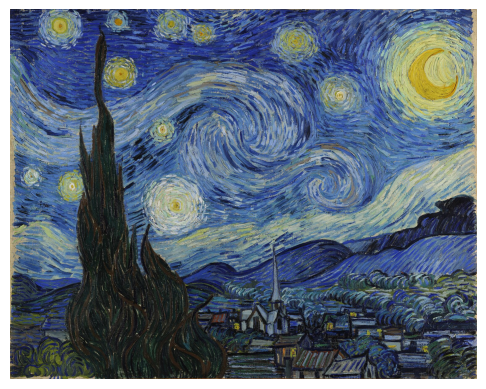

In [ ]:
style_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1513px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg'
style_img = download_image(style_url)
show_image(style_img);

In [ ]:
style_loss = StyleLoss(style_img, layers=(0,5,10,19,28))
content_loss = ContentLoss(content_img, layers=(19,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), combine_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.179,0,True
0.044,0,False


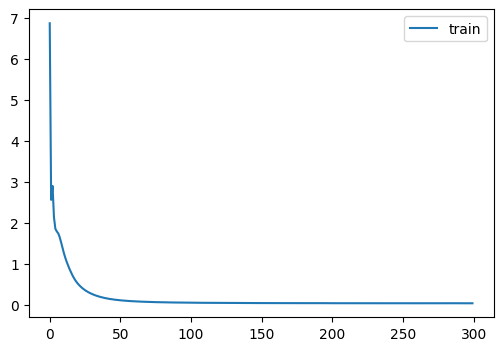

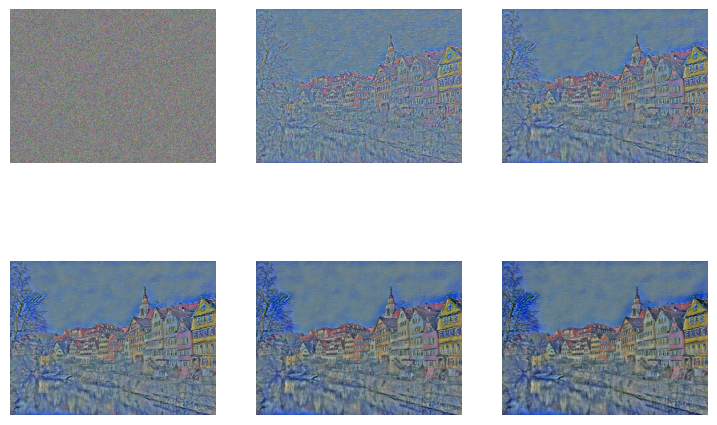

In [ ]:
learn.fit(1)

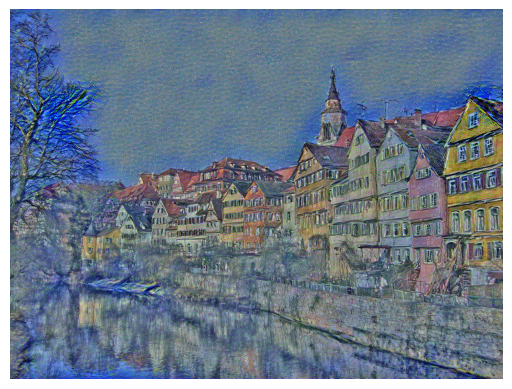

In [ ]:
show_image(to_cpu(learn.model().clip(0, 1)));

### The Shipwreck of the Minotaur

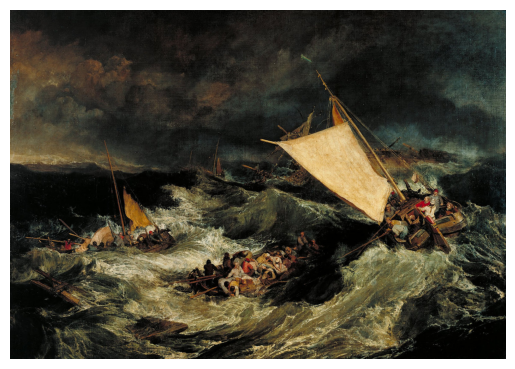

In [ ]:
shipwreck_style_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/a/a0/Joseph_Mallord_William_Turner_-_The_Shipwreck_-_Google_Art_Project.jpg/1600px-Joseph_Mallord_William_Turner_-_The_Shipwreck_-_Google_Art_Project.jpg?20110220021219'
shipwreck_style_image = download_image(shipwreck_style_url)
show_image(shipwreck_style_image);

In [ ]:
style_loss = StyleLoss(shipwreck_style_image, layers=(0,5,10,19,28))
content_loss = ContentLoss(content_img, layers=(19,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), combine_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.215,0,True
0.070,0,False


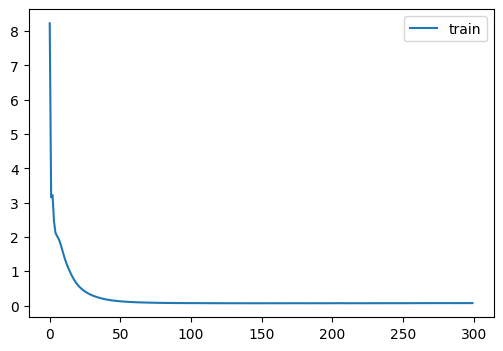

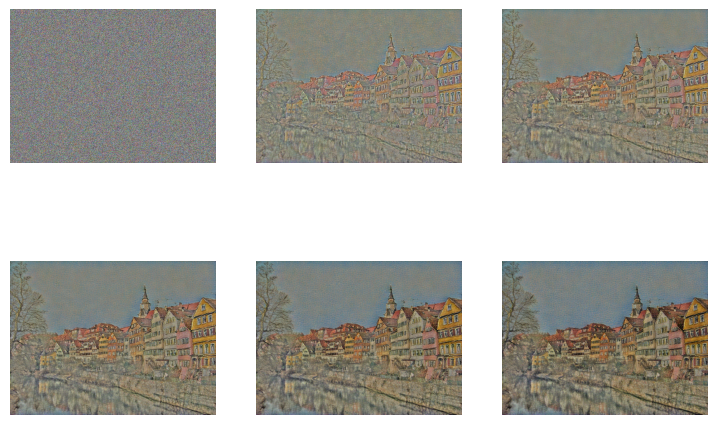

In [ ]:
learn.fit(1)

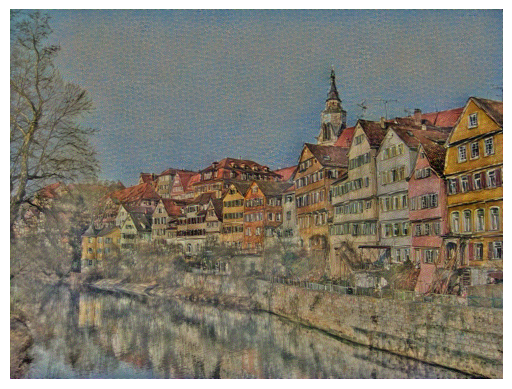

In [ ]:
show_image(to_cpu(learn.model().clip(0, 1)));

### Der Schrei

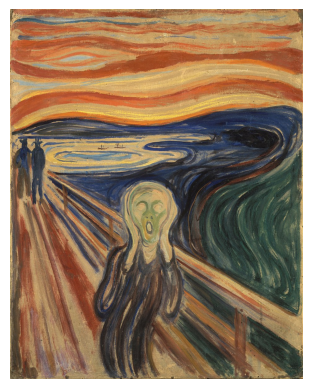

In [ ]:
der_schrei_style_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/8/86/Edvard_Munch_-_The_Scream_-_Google_Art_Project.jpg/947px-Edvard_Munch_-_The_Scream_-_Google_Art_Project.jpg?20211001183357'
der_schrei_style_image = download_image(der_schrei_style_url)
show_image(der_schrei_style_image);

In [ ]:
style_loss = StyleLoss(der_schrei_style_image, layers=(0,5,10,19,28))
content_loss = ContentLoss(content_img, layers=(19,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), combine_loss, cbs=cbs, opt_func=optim.Adam)

loss,epoch,train
0.203,0,True
0.064,0,False


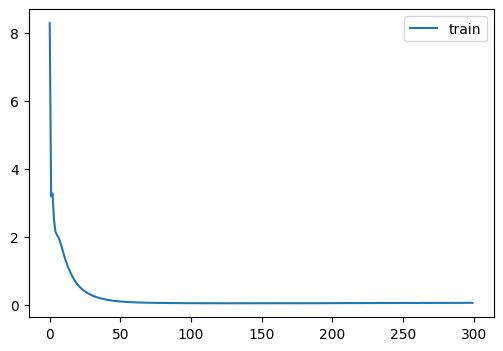

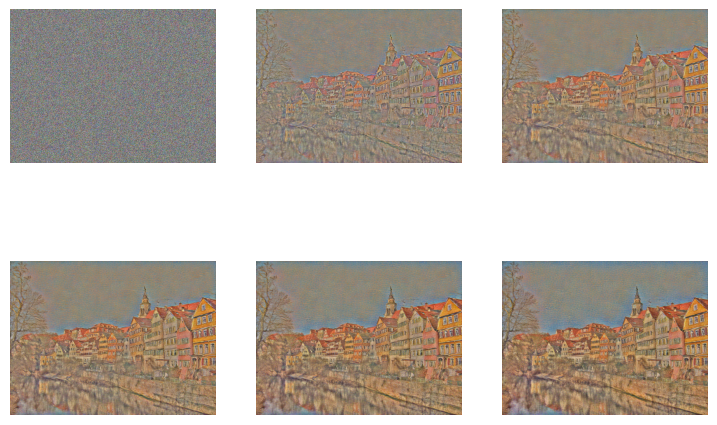

In [ ]:
learn.fit(1)

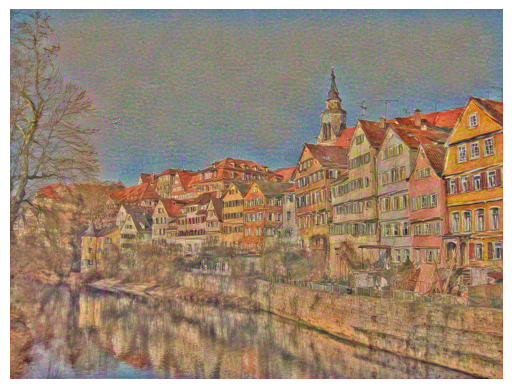

In [ ]:
show_image(to_cpu(learn.model().clip(0, 1)));

### Femme nue Assise

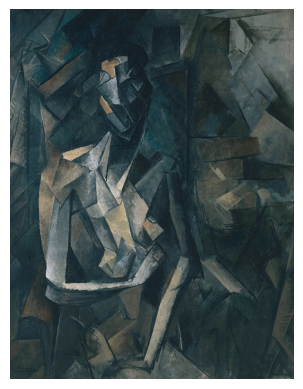

In [ ]:
femme_nue_assise_sytle_url = 'https://upload.wikimedia.org/wikipedia/en/thumb/8/8f/Pablo_Picasso%2C_1909-10%2C_Figure_dans_un_Fauteuil_%28Seated_Nude%2C_Femme_nue_assise%29%2C_oil_on_canvas%2C_92.1_x_73_cm%2C_Tate_Modern%2C_London.jpg/919px-Pablo_Picasso%2C_1909-10%2C_Figure_dans_un_Fauteuil_%28Seated_Nude%2C_Femme_nue_assise%29%2C_oil_on_canvas%2C_92.1_x_73_cm%2C_Tate_Modern%2C_London.jpg?20150127060348'
femme_nue_assise_sytle_image = download_image(femme_nue_assise_sytle_url)
show_image(femme_nue_assise_sytle_image);

loss,epoch,train
0.227,0,True
0.080,0,False


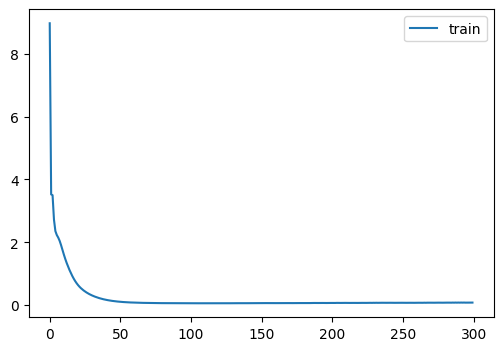

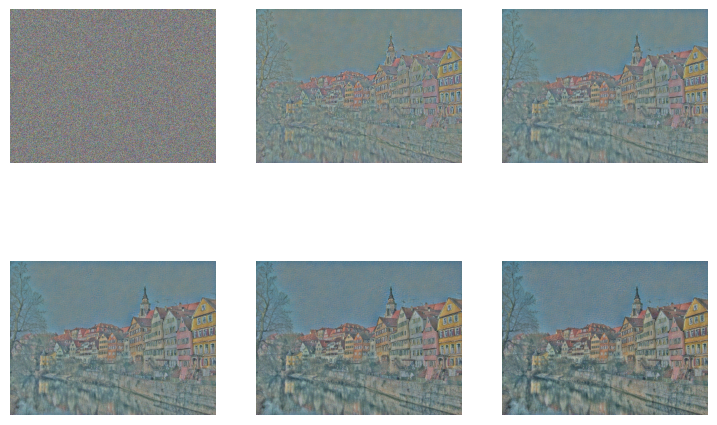

In [ ]:
style_loss = StyleLoss(femme_nue_assise_sytle_image, layers=(0,5,10,19,28))
content_loss = ContentLoss(content_img, layers=(19,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), combine_loss, cbs=cbs, opt_func=optim.Adam)
learn.fit(1)

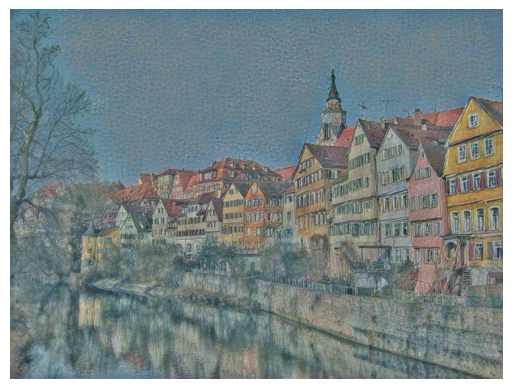

In [ ]:
show_image(to_cpu(learn.model().clip(0, 1)));

### Composition VII

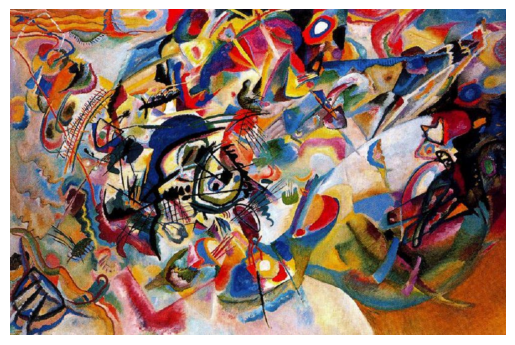

In [ ]:
composition_7_style_url = 'https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg'
composition_7_sytle_image = download_image(composition_7_style_url)
show_image(composition_7_sytle_image);

loss,epoch,train
0.324,0,True
0.143,0,False


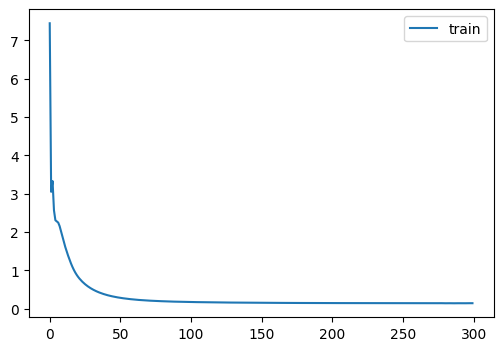

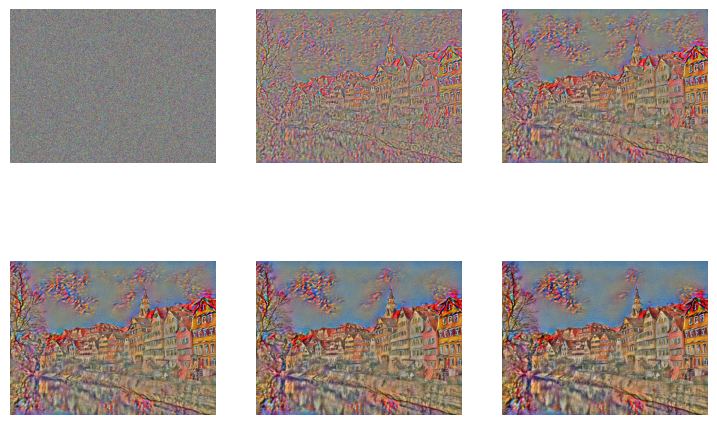

In [ ]:
style_loss = StyleLoss(composition_7_sytle_image, layers=(0,5,10,19,28))
content_loss = ContentLoss(content_img, layers=(19,))
model = TensorModel(torch.rand_like(content_img))
cbs = [DeviceCB(), MetricsCB(), ProgressCB(plot=True), ImageOptCB(), ImageLogCB(60)]
learn = Learner(model, get_dummy_dls(300), combine_loss, cbs=cbs, opt_func=optim.Adam)
learn.fit(1)

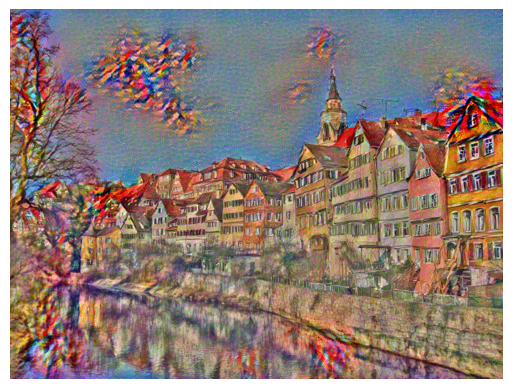

In [ ]:
show_image(to_cpu(learn.model().clip(0, 1)));